In [1]:
## Libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation


## Plot settings
plt.rc('xtick', direction='in', labelsize=14)
plt.rc('ytick', direction='in', labelsize=14)
plt.rc('axes', labelsize=20, titlesize=22)
plt.rc('legend', fontsize=14)
plt.rc('animation', html='jshtml')
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Computer Modern Roman']
plt.rcParams['mathtext.fontset'] = 'cm'

In [2]:
def rotation(phi):
    operator = np.array([[np.cos(phi), -np.sin(phi)],[np.sin(phi), np.cos(phi)]])
    return operator

def translation(vector, coordinate):
    operator = vector + np.array([coordinate[0], coordinate[1]])
    return operator

def argz(z):
    a = np.angle(z)
    if a >= 0:
        return a
    else:
        return 2*np.pi + a

def xy_separator(input_list):
    xs = np.array(input_list)[:,0]
    ys = np.array(input_list)[:,1]
    return xs, ys

def jump_finder(input_list, ref_dist):
    # Define empty possible jumps
    total_jumps = []
    jump_indices = []
    for i in input_list:
        # Calculate every jump for every point
        jumps = [x for x in input_list if  ref_dist - 1*10**(-6) < np.linalg.norm( np.array(i) - np.array(x) ) < ref_dist + 1*10**(-6)]
        # Find index of site to which we may jump
        indices = [j for j in range(len(input_list)) for y in jumps if input_list[j][0] == y[0] and input_list[j][1] == y[1]]
        # Append to main lists
        total_jumps.append(jumps)
        jump_indices.append(indices)
    return total_jumps, jump_indices

def time_evolve_evec(group_of_states, time, evec, eval):

    hbar = 1
    t = time

    # Make the group of states in to vectors and multiply with time op
    phis = [np.exp(1j*(eval[i]/hbar)*t)*evec[i] for i in group_of_states]

    # Make a linear combination equally divided
    a = len(phis)
    psi = sum([(1/a)*x for x in phis])

    phi_norm = psi / (np.sqrt(np.vdot(psi,psi)))

    density_of_states = [(x.conj() * x).real for x in phi_norm]
    
    return phi_norm, density_of_states

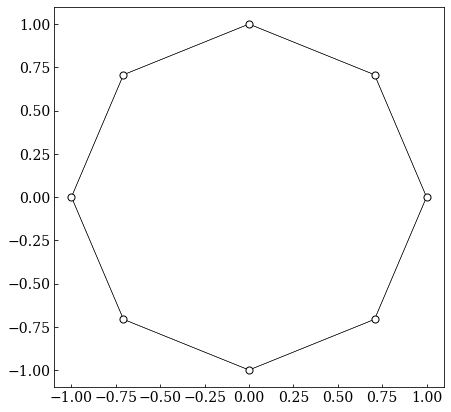

In [3]:
# We first construct a single 8-fold chain wrapped around origin
ref_point = np.array([1,0])
ks = np.arange(0,8)
points = [np.matmul(rotation((np.pi/180)*45*k), ref_point) for k in ks]

# Create jump coordinates by referencing a length
reference_dist = np.linalg.norm(points[0] - points[1])
jump_coors, jump_indices = jump_finder(points, reference_dist)

fig, ax = plt.subplots(figsize= (7,7))
marker_size = 50

xs, ys = xy_separator(points)

ax.scatter(x= xs, y= ys, facecolor= 'w', edgecolor= 'k', s= marker_size, zorder= 2)

for i,j in zip(points, jump_coors):
    xs, ys = xy_separator(j)
    for l,k in zip(xs,ys):
        ax.plot([i[0],l], [i[1],k], color= 'k', zorder= 1, linewidth= 0.5)

plt.show()

In [4]:
def Hamil_solve(z, w, B):
    # Define now a skeleton of the Hamiltonian 
    dim_H = len(z)
    H = np.zeros((dim_H, dim_H), dtype= np.complex128)
    k_H = [x for x in range(0, dim_H)]
    # Calculate Peierls phase factor according to the 1st artcle 
    
    # Start by finding the tile length
    tile_lens = [np.linalg.norm(np.array(z[0]) - np.array(x)) for x in w[0]]
    tile_lens_sum = np.sum(tile_lens)
    l  = tile_lens_sum/len(tile_lens)
    phi = B * l**2
    phi_0 = 2 * np.pi
    jump_products = []
    for i, j in zip(z, w):
        products = [(i[0]*k[1] - k[0]*i[1]) for k in j]
        jump_products.append(products)
    phase_factors = []
    for i, j in zip(z, jump_products):
        phases = [-(phi/(2 * l**2)) * k for k in j]
        phase_factors.append(phases)

    # Scaling via J, maybe energy factor
    J = 1
    # Fill out the Hamiltonian according to the psi vector, i.e. the basis chosen through generation of the tiling
    for x, y, z in zip(k_H, jump_indices, phase_factors):
        for k, t in zip(y, z):
            H[x, k] = -J * np.exp(1j * t)

    # Now we find the eigenvalues and eigenvectors
    # Note that eigh returns normalized eigenvectors!
    # Note the eigenvectors are arranged in a matrix so eig_vecs[:,i] chooses the i'th column which is the i'th eigenvector
    eig_vals, U = np.linalg.eigh(H)
    eig_vecs = np.array([U[:,i] for i in range(len(U))])
    return eig_vals, eig_vecs, H

# We want to know when phi/phi0 = 1, this happens when phi = 2pi
# phi in this case is phi = B*l*2 so B must be equal to
B_full = (2*np.pi)/(reference_dist**2)

# Take field strength of B= 2pi so that phi/phi0= 0.5
evals, evecs, H = Hamil_solve(points, jump_coors, (0.25)*B_full)

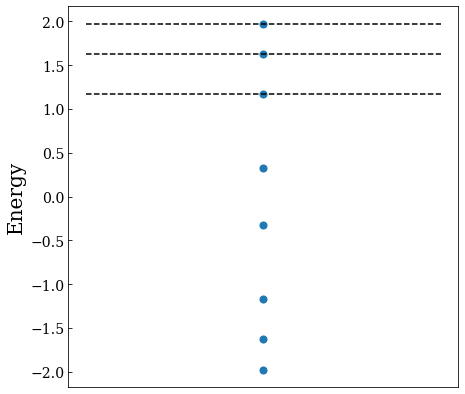

In [20]:
fig, ax = plt.subplots(figsize= (7,7))

xs = np.zeros(8)
ys = [x for x in evals]

ax.scatter(x= xs, y= ys, s= marker_size)
ax.set_xticks([])
ax.set_ylabel('Energy')

group = [7, 5, 6]

x_minimal = -1
x_maximal = 1

for i in group:
    ax.hlines(y= evals[i], xmin= x_minimal, xmax= x_maximal, linestyles= '--', colors= 'k')

plt.show()

In [5]:
# This takes a vector from the basis of lattice sites and rotates it n-fold and assigns to a new vector in the same
def rot_op(site, n):
    # Site is a vector describing the coordinate of a supposed occupied site, which we want rotate (1/n)-fold
    # Rads tells the operator how much we should rotate
    rads = (2*np.pi)/(n)
    
    # Rotate site
    rot_site = np.matmul(rotation(rads), np.array(site))
    
    # We aim to assign the rotated site to an already exisiting coordiante pair, so we will compare with grid_scaled
    
    # Find sites close enough
    grain2 = -5
    close_by_ele = [(ele, count) for count, ele in enumerate(np.array(points)) if -10**(grain2) <= np.linalg.norm(rot_site - np.array(ele)) <= 10**(grain2)]
    if len(close_by_ele) > 1 or len(close_by_ele) == 0:
        print(f'close_by_eles has a length of {len(close_by_ele)}')
        return
    else:
        # This more than likely only returns one element
        # This element comes with an index which we use to assign the rotated site to the preexisting coordinates
        new_site = points[close_by_ele[0][1]]
        new_x = new_site[0]
        new_y = new_site[1]
        ns_index = close_by_ele[0][1]
        return (new_x, new_y), ns_index
    

# We now use the above function to construct an explicit rotation operator by applying and extracting the index for every basis element
dim = len(points)
R = np.zeros((dim,dim),dtype= np.complex128)
indices = []
new_coordinates = []
for w in range(dim):
    coor, rot_index = rot_op(points[w], 8)
    indices.append(rot_index)
    new_coordinates.append(coor)

complex_coor = [complex(*x) for x in points]
complex_coor_rot = [complex(*x) for x in new_coordinates]
# With the new coordinates of each transformed coordinate we may determine the phase between 
#phases = [y/x for x, y in zip(complex_coor, complex_coor_rot)]
#theta = [arg(z) for z in phases]

for i, j in zip(range(dim), indices):
    # Note the order is to make sure in the picture of a matrix being made of column vectors, that we get the right non-zero entries
    # If we flip the order we get the transpose. Reason being that np intreprets entries along every row constituting the matrix in stead
    R[j][i] = 1

In [6]:
R# Function for calculating the eigenvalue of the rotation operator on an eigenvector of the Hamiltonian
# This will be used for estimating angular momentum
def rot_eval(evec):
    # Apply rotation to eigenvector
    rot = np.matmul(R,evec)

    # Check of phases
    phases = [y/x for x,y in zip(evec, rot)]

    # Give argument
    args = [argz(x) for x in phases]
    # Make an average
    avg_arg = (1/(len(rot))) * np.sum(args)
    return avg_arg

# One could use this but we use below method via diagoal matrix
"""# Calculate the different average arguments
args = [rot_eval(x) for x in evecs]
with open('../Separate_files/args.txt', 'w') as file:
    for i in args:
        file.write(f'{i}')
        file.write('\n')"""

# Calculate the diagonal matrix D containing eigenvalues of R
# This is done by matrix elements np.vdot(i,R,j)

D = np.zeros((dim,dim), dtype= np.complex128)
for i, elei in enumerate(evecs):
    for j, elej in enumerate(evecs):
        D[i][j] = np.vdot(elei, np.matmul(R,elej))

rot_evals_diag = np.diag(D)
diag_args = [argz(x) for x in rot_evals_diag]

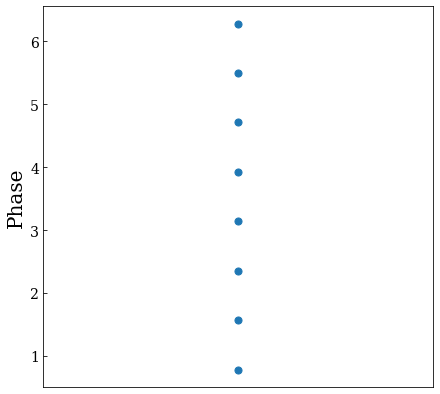

In [7]:
fig, ax = plt.subplots(figsize= (7,7))

xs = np.zeros(8)
ys = [x for x in diag_args]

ax.scatter(x= xs, y= ys, s= marker_size)
ax.set_xticks([])
ax.set_ylabel('Phase')

plt.show()

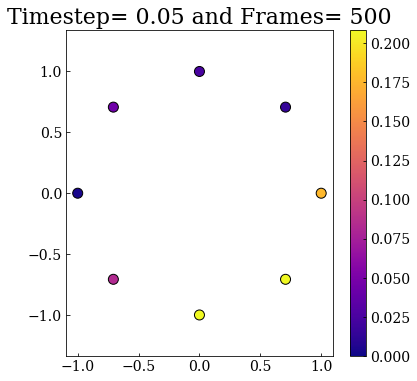

In [29]:
# Now we select the states with phases matching up to those chosen in the analysis

group = [7, 5, 6]

## Magic line for animation
%matplotlib inline
# Attempt at animating time evolution

# Set figure up first
fig, ax = plt.subplots(figsize=(6,6))
# Set bascis
sites = ax.scatter(x=[], y=[], c=[])

xs = [w[0] for w in points]
ys = [w[1] for w in points]


# Set timesteps, state of choice for animation, and number of frames
timestep = 0.05
n_frames = 500

group_of_choice =  group

psi_0, dos_0 = time_evolve_evec(group_of_choice, 0, evecs, evals)

dos_max = max(dos_0)

#dos_max = 1

#plt.set_cmap('binary')
plt.set_cmap('plasma')
#cax = ax.scatter(x= xs, y= ys, s= marker_size, c= dos_max, zorder= 2)
marker_size = 100

# This function will do the animating
def update(i):
    plt.clf()
    # t is the steps we progress, timestep sets the steplength
    t = i * timestep

    # Using the time evolution to find density of states for each increment
    psi, dos = time_evolve_evec(group_of_choice, t, evecs, evals)
    cf = plt.scatter(x= xs, y= ys, c= dos, edgecolors= 'k', s= marker_size, vmin=0, vmax= dos_max)
    plt.colorbar(cf)
    plt.title(f'Timestep= {timestep} and Frames= {n_frames}')
    plt.axis('equal')


anim = FuncAnimation(fig, update, frames= n_frames, interval=250)

name = '_'+''.join([str(ele) + '_' for ele in group_of_choice])

anim.save(f'../../Animations/Motion_of_states_for_AB_examination.gif', writer='imagemagick', fps=30)

anim